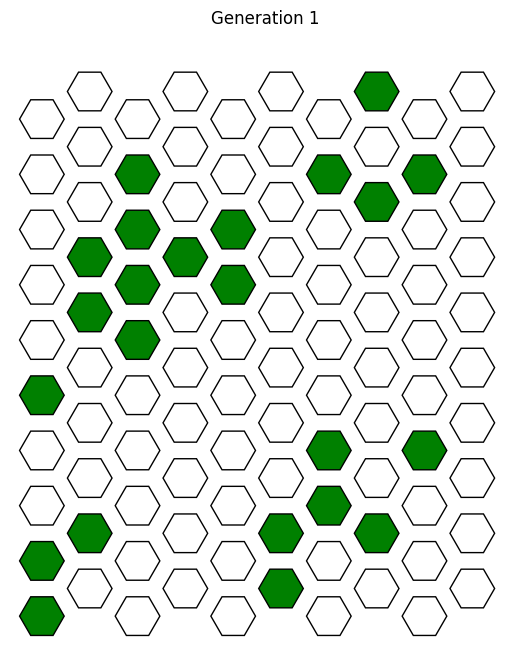

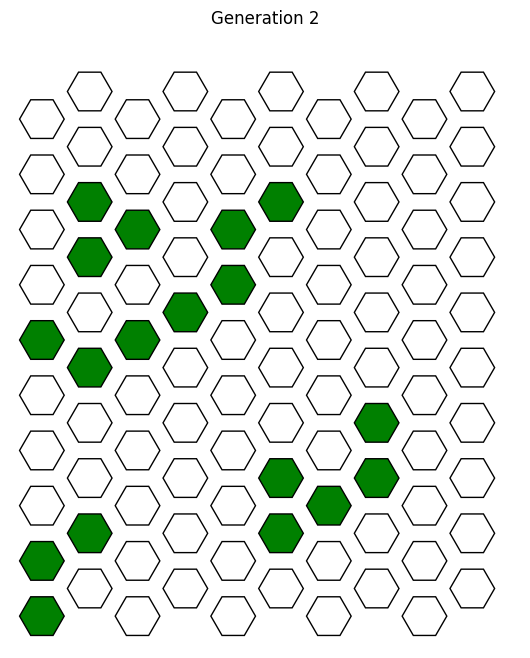

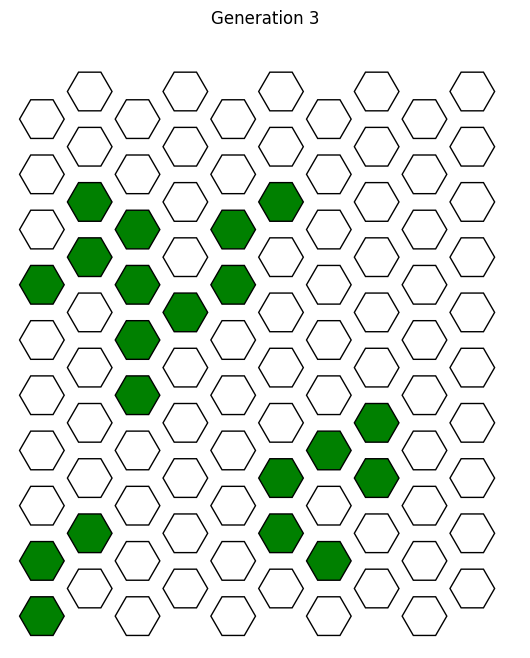

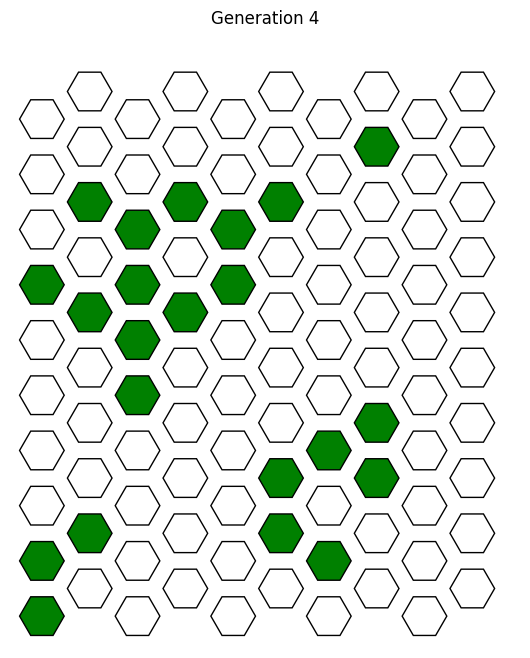

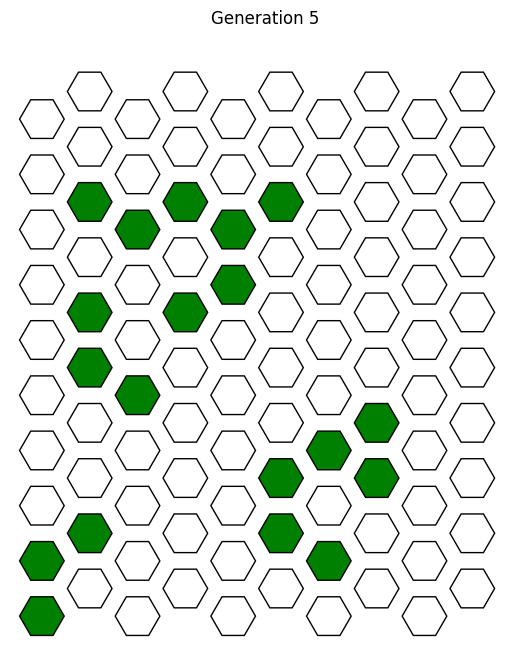

...

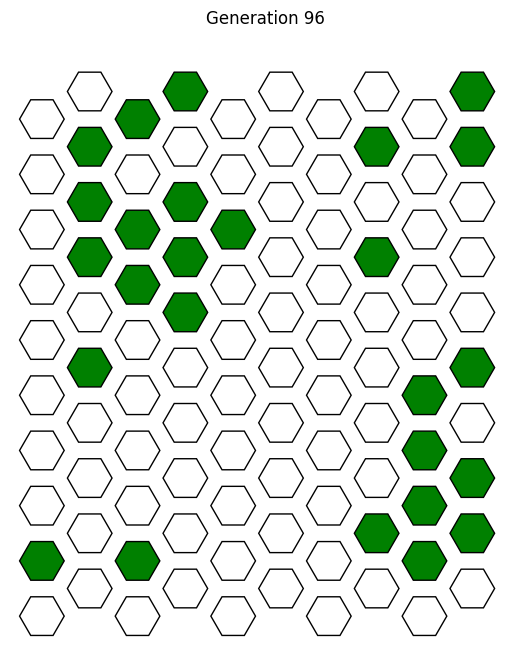

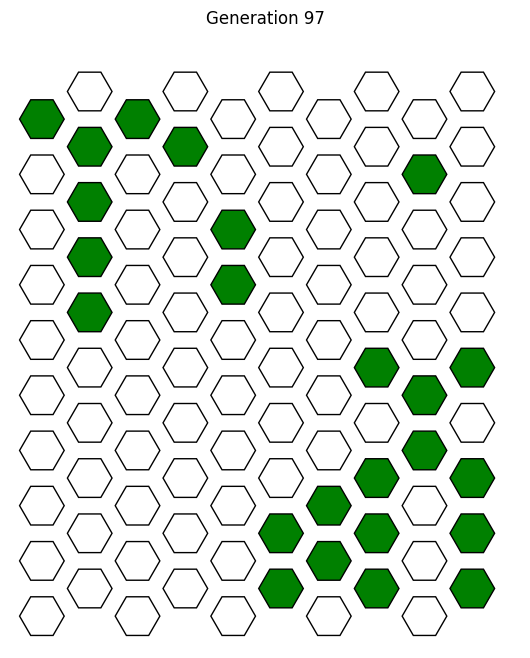

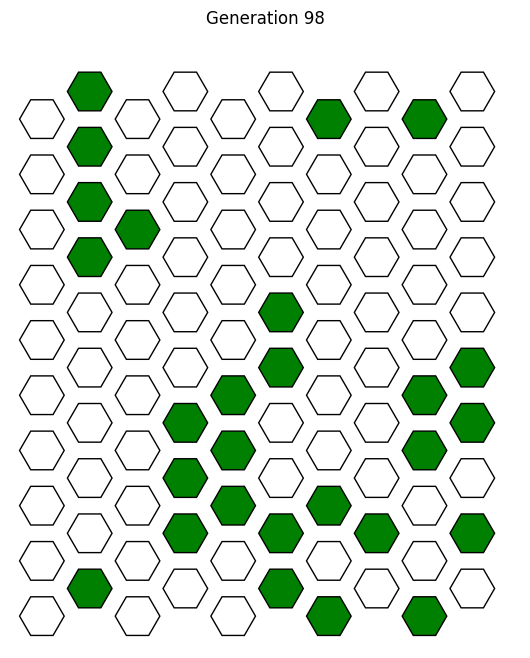

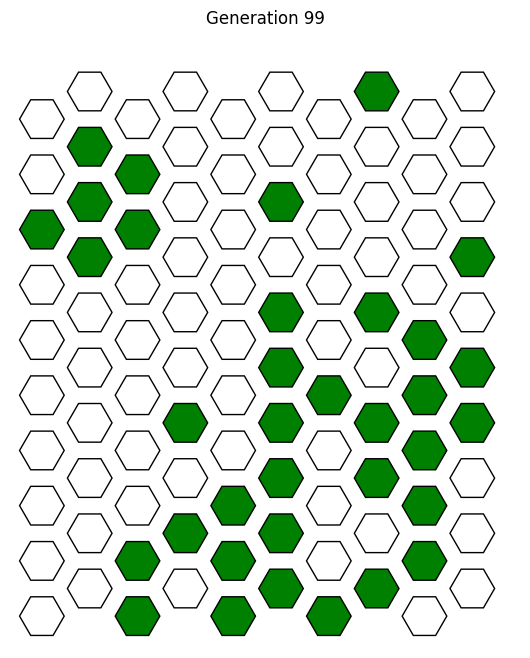

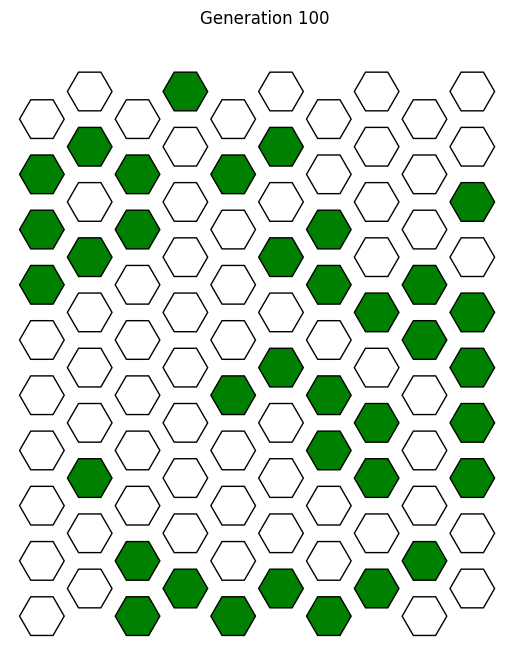

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import random


class Node:
    def __init__(self, row, col):
        self.row = row
        self.col = col
        self.isAlive = False
        self.shouldSwap = False
        self.generations_dead = 0
        self.death_cause = None


    def count_living_neighbors(self, grid):
        offsets = [(0, -1), (0, 1), (-1, 0), (1, 0), (-1, -1), (1, 1)]
        sum_alive = 0
        for dr, dc in offsets:
            new_row, new_col = self.row + dr, self.col + dc
            if 0 <= new_row < len(grid) and 0 <= new_col < len(grid[new_row]):
                if grid[new_row][new_col].isAlive:
                    sum_alive += 1
        return sum_alive


    def check_swap(self, grid):
        living = self.count_living_neighbors(grid)
        if self.isAlive:
            if living < 2 or living > 3:
                self.shouldSwap = True
                self.death_cause = 'underpopulation' if living < 2 else 'overpopulation'
        else:
            self.generations_dead += 1
            if living == 3 or self.generations_dead == 6:
                self.shouldSwap = True
                self.death_cause = None


    def do_swap(self):
        if self.shouldSwap:
            self.isAlive = not self.isAlive
            if not self.isAlive:
                self.generations_dead = 0
            self.shouldSwap = False


def initialize_hexagonal_grid(size, density):
    grid = []
    for row in range(size):
        row_arr = []
        for col in range(size):
            hex_node = Node(row, col)
            if random.random() < density:
                hex_node.isAlive = True
            row_arr.append(hex_node)
        grid.append(row_arr)
    return grid


def show_image(grid, generation):
    fig, ax = plt.subplots(figsize=(8, 8))
    for row in range(len(grid)):
        for col in range(len(grid[row])):
            x = col * 1.5
            y = row * np.sqrt(3) + (col % 2) * np.sqrt(3) / 2
            if grid[row][col].isAlive:
                hexagon = patches.RegularPolygon((x, y), numVertices=6, radius=0.7, orientation=np.radians(30), edgecolor='black', facecolor='green')
            else:
                hexagon = patches.RegularPolygon((x, y), numVertices=6, radius=0.7, orientation=np.radians(30), edgecolor='black', facecolor='white')
            ax.add_patch(hexagon)
    ax.set_aspect('equal', 'box')
    ax.set_xlim(-1, len(grid[0]) * 1.5)
    ax.set_ylim(-1, len(grid) * np.sqrt(3) + 1)
    ax.axis('off')
    plt.title(f'Generation {generation}')
    #plt.savefig(f'generation_{generation}.png')
    plt.show()
    plt.close()


def step(grid, generation):
    all_dead = True
    for row in grid:
        for node in row:
            node.check_swap(grid)
    for row in grid:
        for node in row:
            node.do_swap()
            if node.isAlive:
                all_dead = False
    if generation % 4 == 0:
        dead_nodes = [(row, col) for row in range(len(grid)) for col in range(len(grid[row])) if not grid[row][col].isAlive]
        if dead_nodes:
            row, col = random.choice(dead_nodes)
            grid[row][col].isAlive = True
    return all_dead


def main(size, density, generations):
    grid = initialize_hexagonal_grid(size, density)
    for generation in range(1, generations+1):
        all_dead = step(grid, generation)
        show_image(grid, generation)
        if all_dead:
            grid = initialize_hexagonal_grid(size, density)


main(size=10, density=0.3, generations=100)
